In [ ]:
pip install pandas geopandas matplotlib openpyxl


In [ ]:
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 57.7 MB/s eta 0:00:00


In [ ]:
pip install plotly

In [ ]:
pip install plotly pandas openpyxl ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.9 MB/s eta 0:00:00


In [ ]:
pip install leafmap geopandas openpyxl


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 537.2/537.2 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.7/220.7 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 765.5/765.5 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.8/206.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 5.1 MB/s eta 0:00:00


In [ ]:
!pip install mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 3.6 MB/s eta 0:00:00


--2025-04-24 15:47:15--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.92.195.113, 52.92.234.161, 52.92.133.209, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.92.195.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.4’

ne_110m_admin_0_cou 100%[===================>] 209.94K  --.-KB/s    in 0.04s   

2025-04-24 15:47:15 (5.39 MB/s) - ‘ne_110m_admin_0_countries.zip.4’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.c

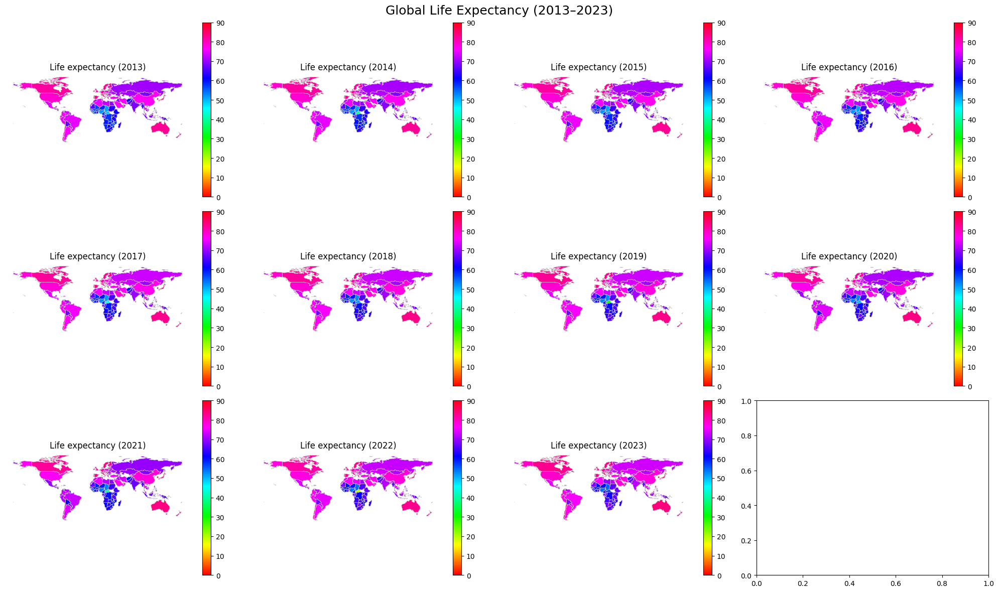

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx


df = pd.read_excel("/content/blueprint5.xlsx", sheet_name="Sheet1")

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

df = df.rename(columns={"Code": "iso_a3", "Life_Expectancy": "life_expectancy"})
gdp_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2023)]

years = sorted(gdp_data["Year"].unique())
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12)) # Remove constrained_layout=True
axes = axes.flatten()


for i, year in enumerate(years):
    ax = axes[i]
    year_data = gdp_data[gdp_data["Year"] == year]
    merged = world.merge(year_data, how="left", left_on="ISO_A3", right_on="iso_a3") # Changed left_on to 'ISO_A3' to match the column name in the downloaded shapefile
    merged.plot(column="life_expectancy", cmap="hsv", linewidth=0.5, ax=ax, edgecolor='0.8', legend=True, vmin=0,vmax=90)  # Fixed minimum for color scale
    ax.set_title(f"Life expectancy ({year})")
    ax.axis("off")

plt.suptitle("Global Life Expectancy (2013–2023)", fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import geopandas as gpd
import plotly.express as px

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet1")

df = df.rename(columns={"Code": "iso_a3", "Life_Expectancy": "life_expectancy"})
life_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2024)]

fig = px.choropleth(
    life_data,
    locations="iso_a3",
    color="life_expectancy",
    hover_name="Country",
    animation_frame="Year",
    color_continuous_scale="Earth",
    title="Global Life Expectancy (2013–2023)",
    labels={"life_expectancy": "Life Expectancy"},
    range_color=(0,90)
)

fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.write_html("global_gdp_per_capita_2013_2023.html")
fig.show()


--2025-04-24 15:45:15--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.92.137.113, 52.92.180.129, 52.92.240.169, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.92.137.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.3’

ne_110m_admin_0_cou 100%[===================>] 209.94K  --.-KB/s    in 0.06s   

2025-04-24 15:45:15 (3.66 MB/s) - ‘ne_110m_admin_0_countries.zip.3’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.c

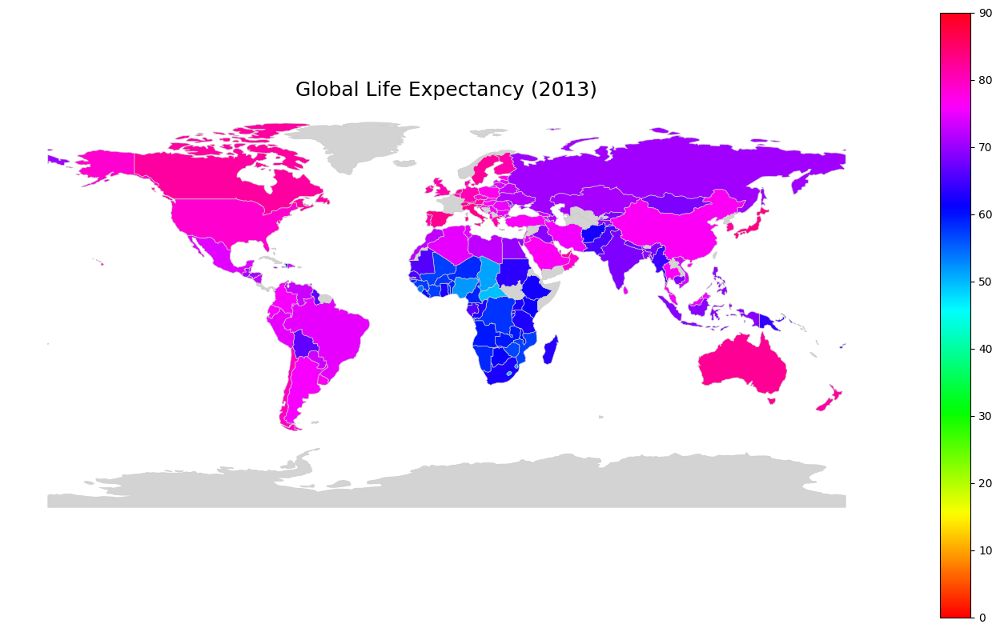

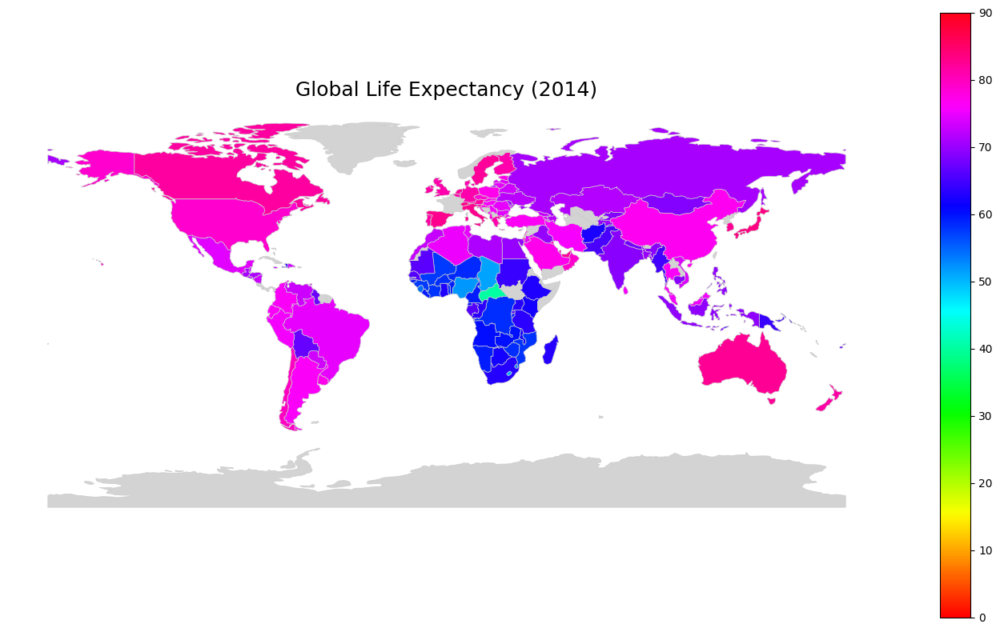

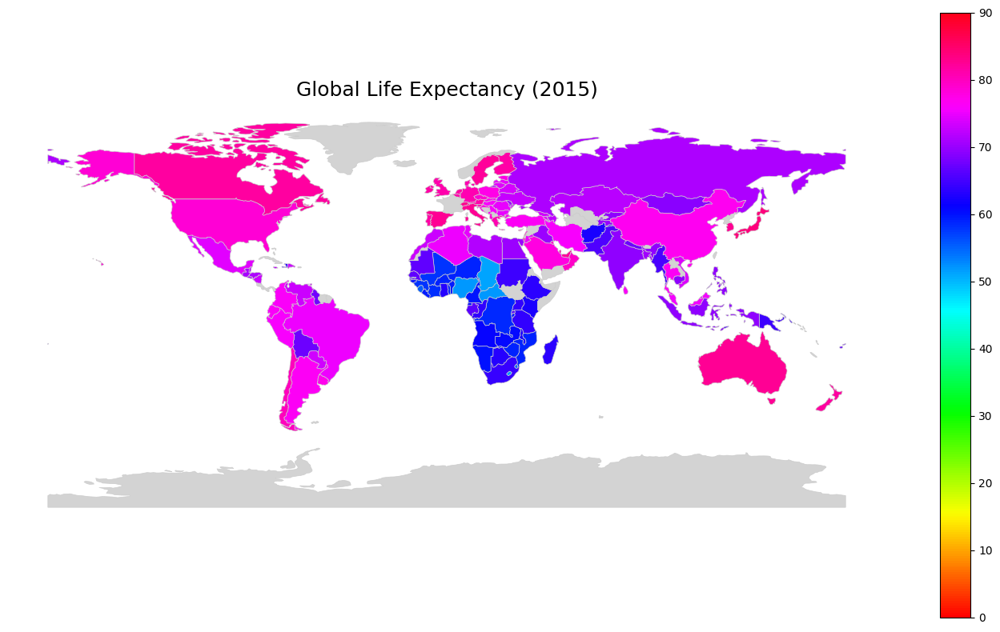

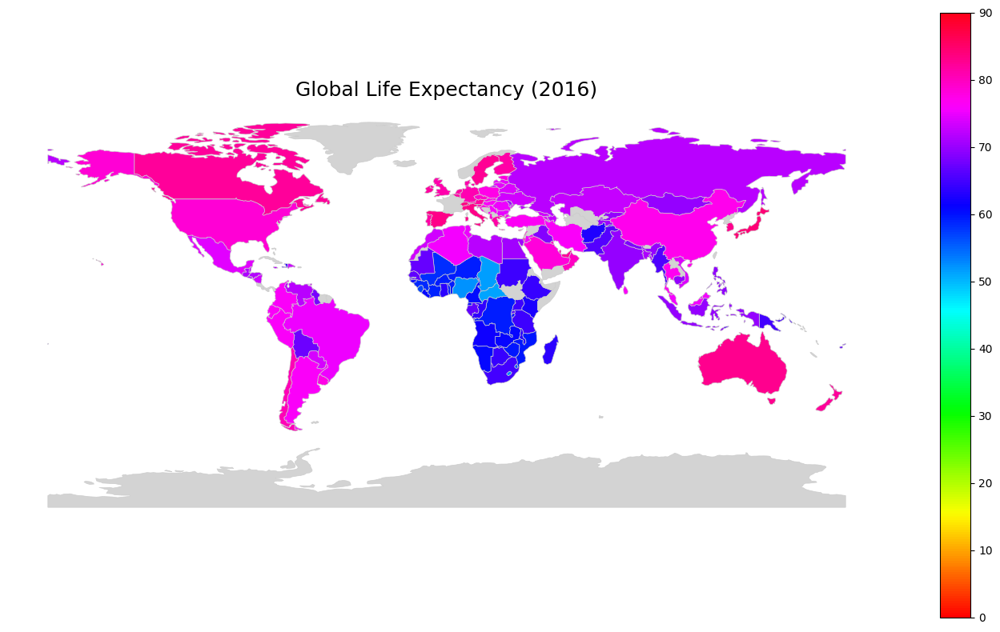

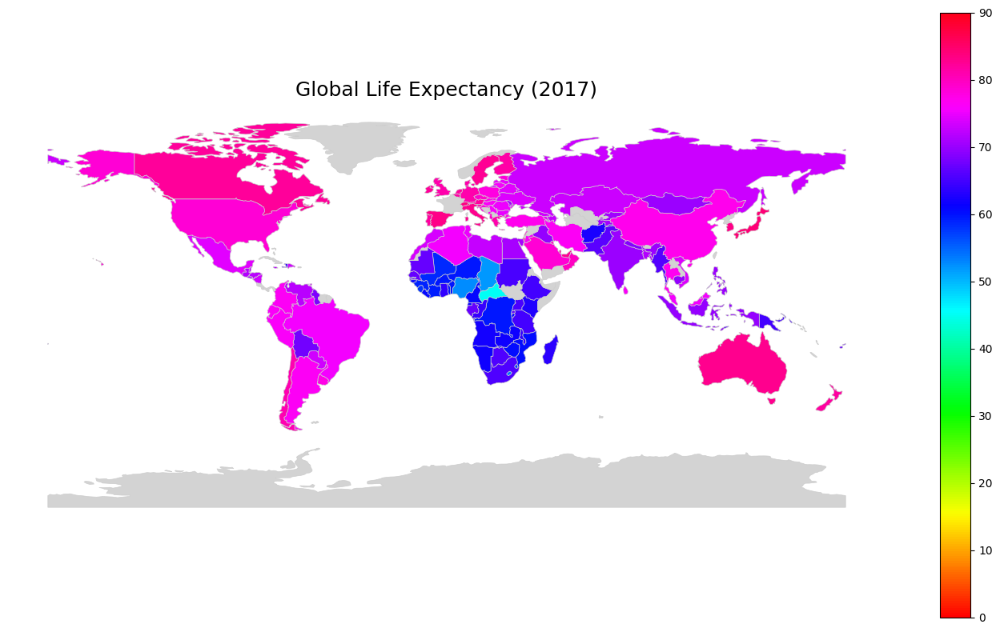

...

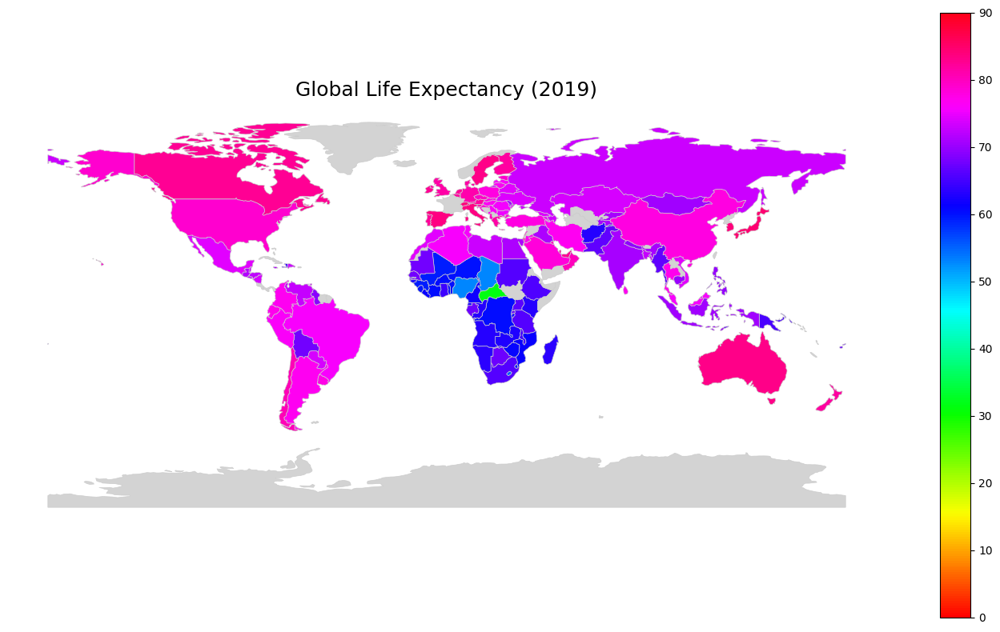

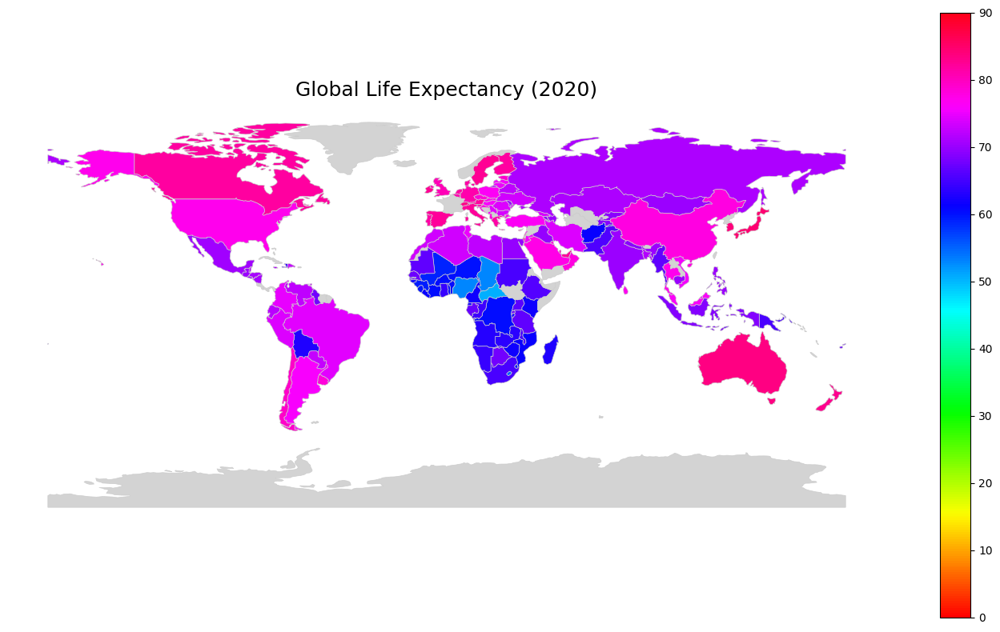

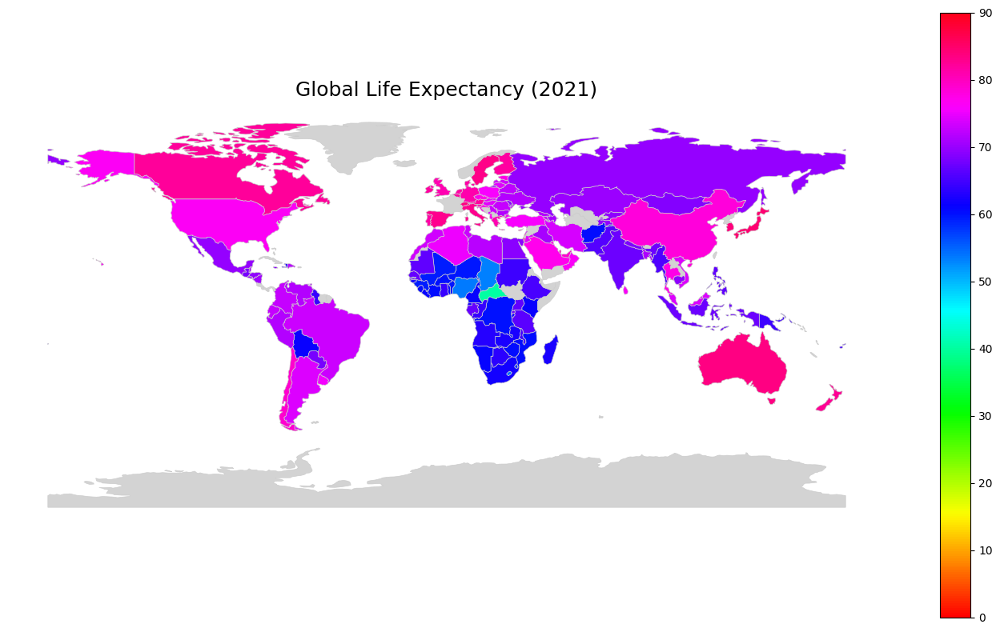

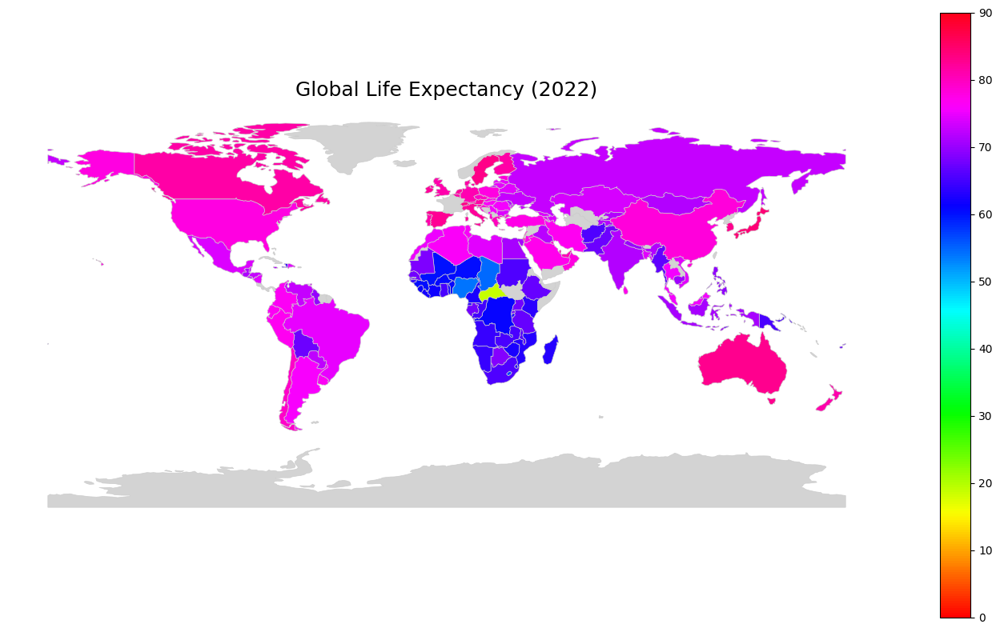

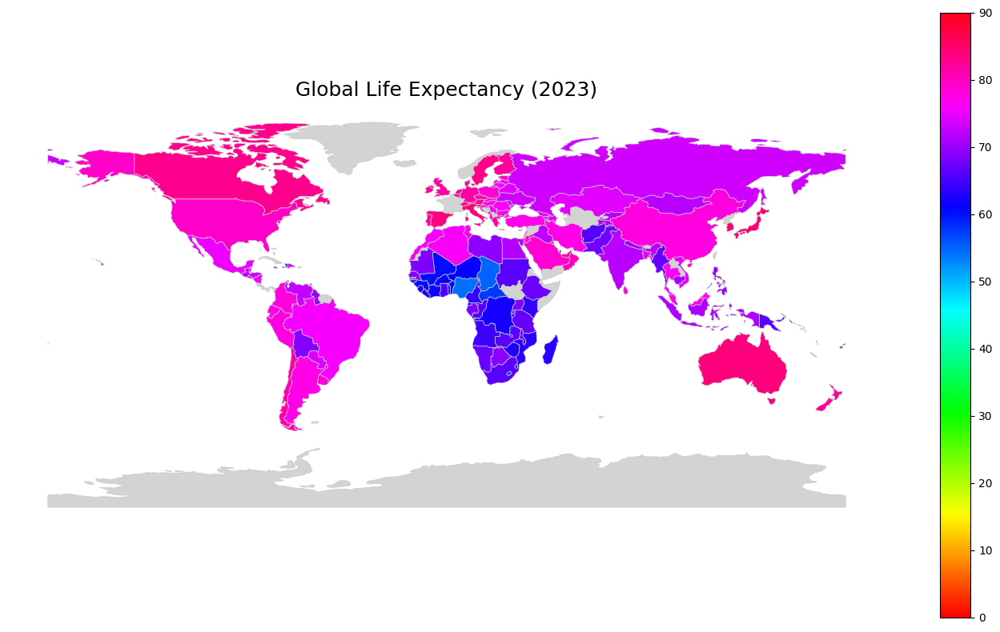

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet1")

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

df = df.rename(columns={"Code": "iso_a3", "Life_Expectancy": "life_expectancy"})
life_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2023)]

years = sorted(life_data["Year"].unique())


for year in years:
    year_data = life_data[life_data["Year"] == year]
    merged = world.merge(year_data, how="left", left_on="ISO_A3", right_on="iso_a3")

    fig, ax = plt.subplots(figsize=(14, 8))
    merged.plot(column="life_expectancy",
                cmap="hsv",
                linewidth=0.5,
                ax=ax,
                edgecolor='0.8', vmin=0,vmax=90,
                legend=True,
                missing_kwds={
                    "color": "lightgrey",
                    "label": "No data"
                })

    ax.set_title(f"Global Life Expectancy ({year})", fontsize=18)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

--2025-04-20 19:41:17--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.92.231.25, 52.92.179.81, 3.5.79.172, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.92.231.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip’

ne_110m_admin_0_cou 100%[===================>] 209.94K   743KB/s    in 0.3s    

2025-04-20 19:41:17 (743 KB/s) - ‘ne_110m_admin_0_countries.zip’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
  inflating: ne_110m_admin_0_countries.README.html  
 extracting: ne_110m_admin_0_countries.VERSION.txt  
 extracting: ne_110m_admin_0_countries.cpg  
  inflating: ne_110m_admin_0_countries.dbf  
  inflating: ne_110m_admin_0_countries.prj  
  inflating: ne_110m_admin_0_countries.shp  
  inflating: ne_110m_admin_0_countries.s

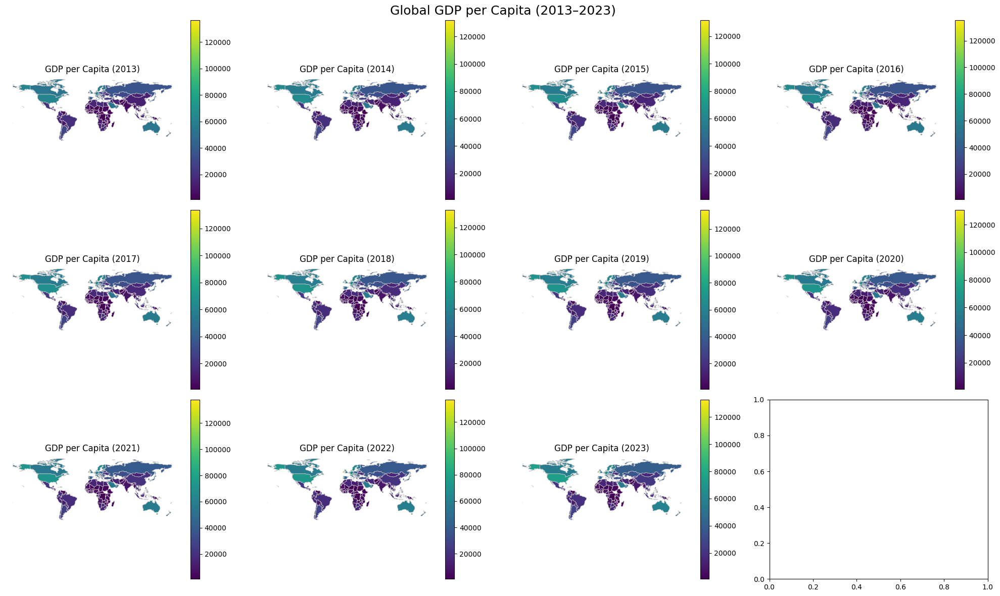

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx


df = pd.read_excel("/content/blueprint5.xlsx", sheet_name="Sheet1")

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})
gdp_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2023)]

years = sorted(gdp_data["Year"].unique())
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12)) # Remove constrained_layout=True
axes = axes.flatten()

for i, year in enumerate(years):
    ax = axes[i]
    year_data = gdp_data[gdp_data["Year"] == year]
    merged = world.merge(year_data, how="left", left_on="ISO_A3", right_on="iso_a3") # Changed left_on to 'ISO_A3' to match the column name in the downloaded shapefile
    merged.plot(column="gdp_per_capita", cmap="viridis", linewidth=0.5, ax=ax, edgecolor='0.8', legend=True)
    ax.set_title(f"GDP per Capita ({year})")
    ax.axis("off")

plt.suptitle("Global GDP per Capita (2013–2023)", fontsize=18)
plt.tight_layout()
plt.show()

--2025-04-20 19:41:46--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.92.176.153, 52.92.164.249, 52.218.246.251, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.92.176.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.1’

ne_110m_admin_0_cou 100%[===================>] 209.94K   985KB/s    in 0.2s    

2025-04-20 19:41:46 (985 KB/s) - ‘ne_110m_admin_0_countries.zip.1’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.c

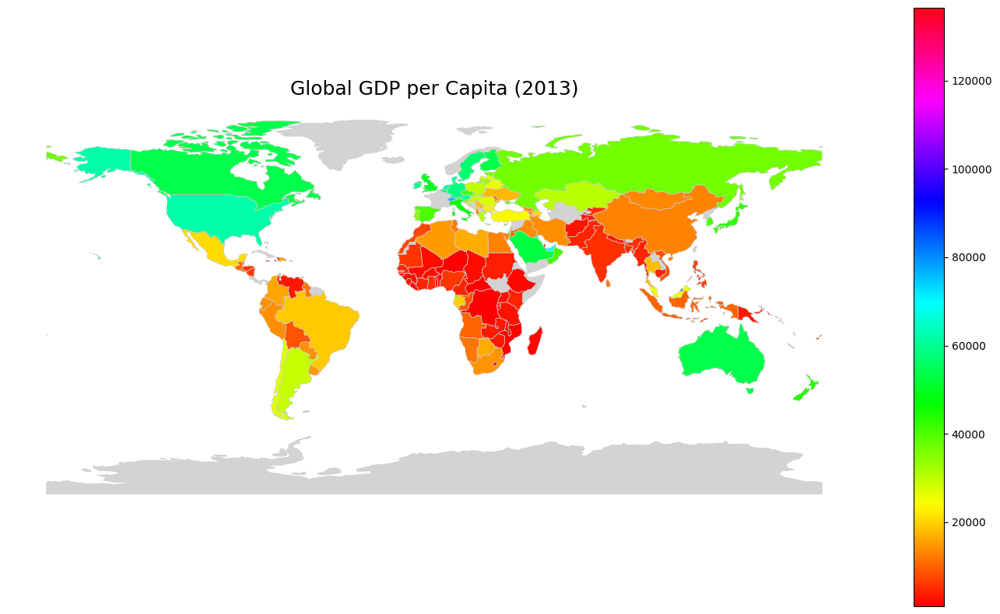

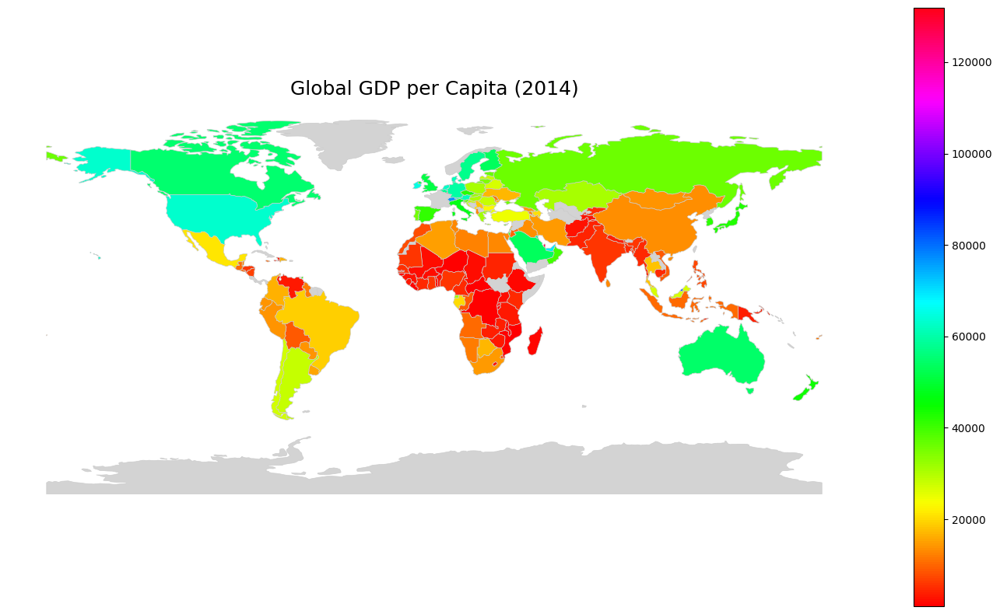

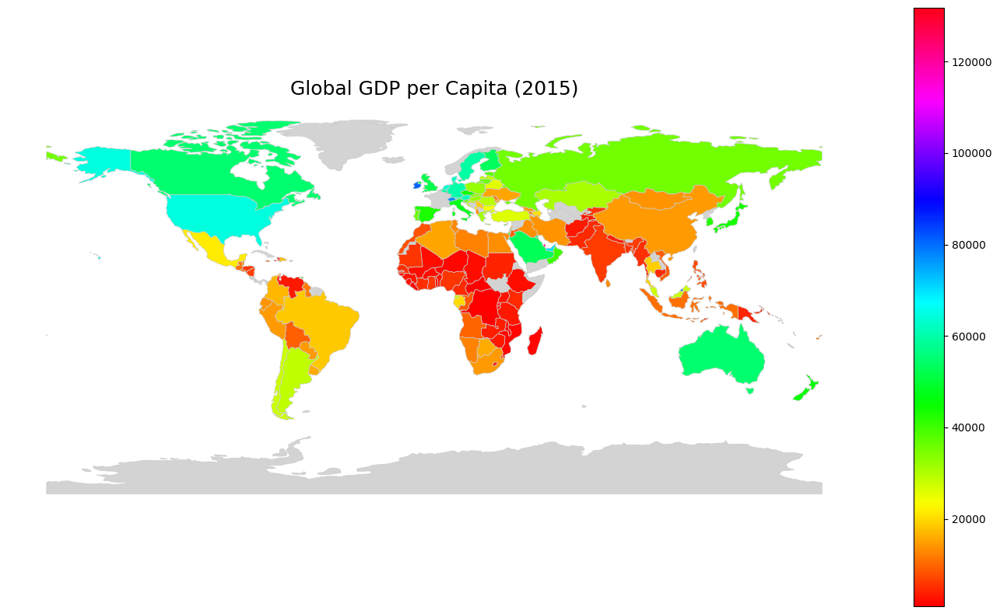

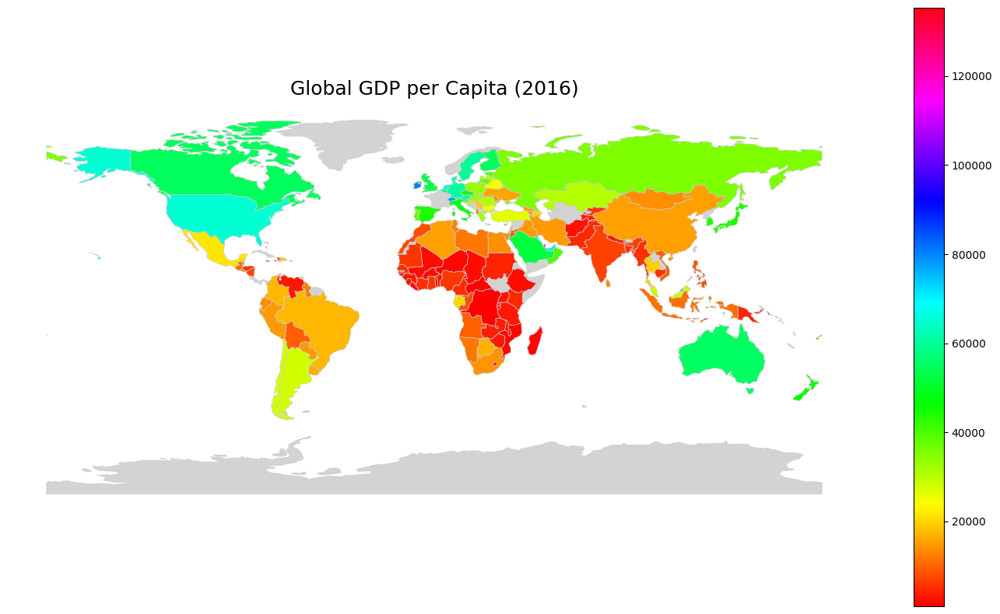

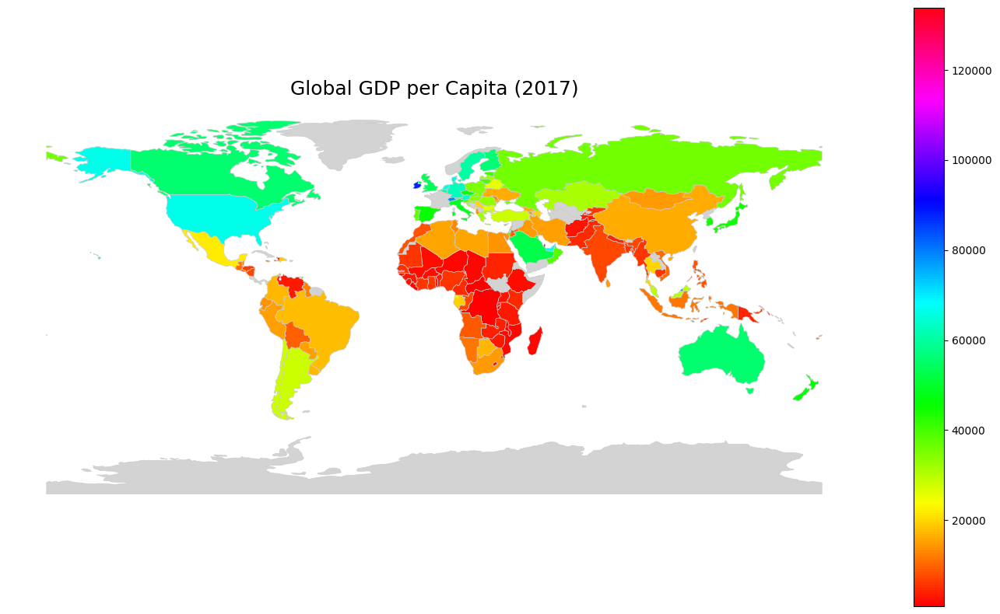

...

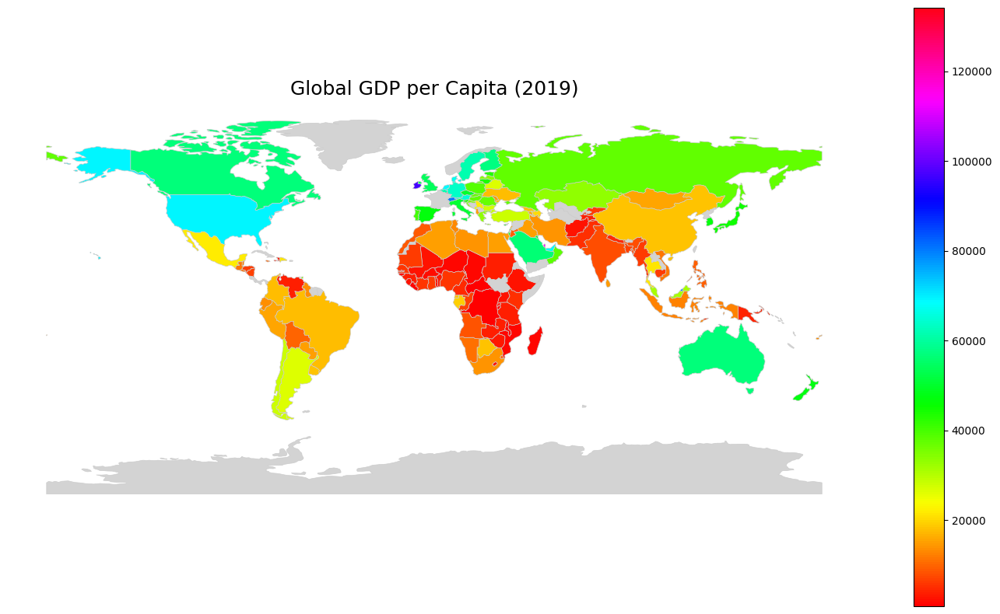

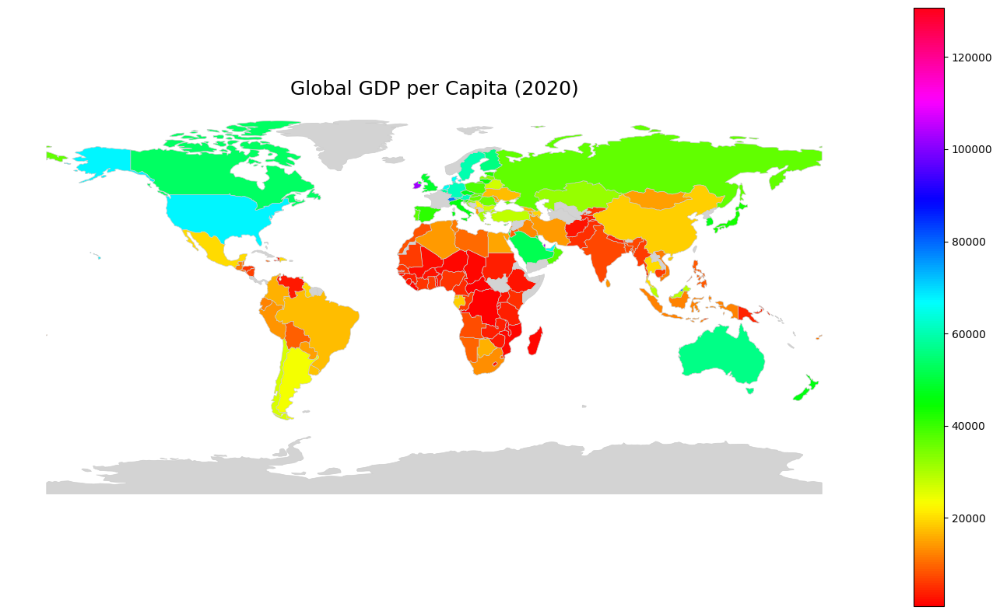

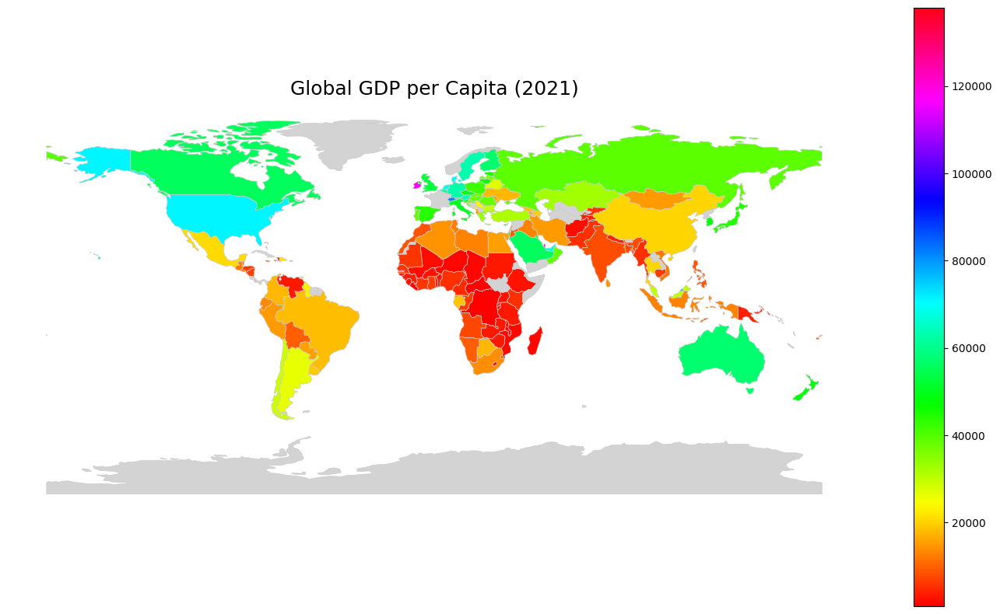

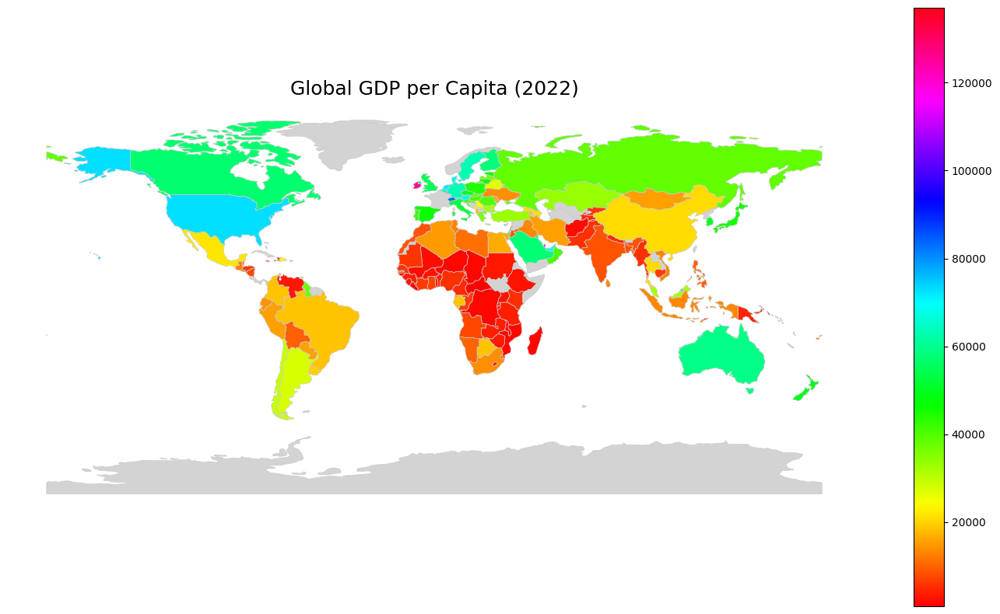

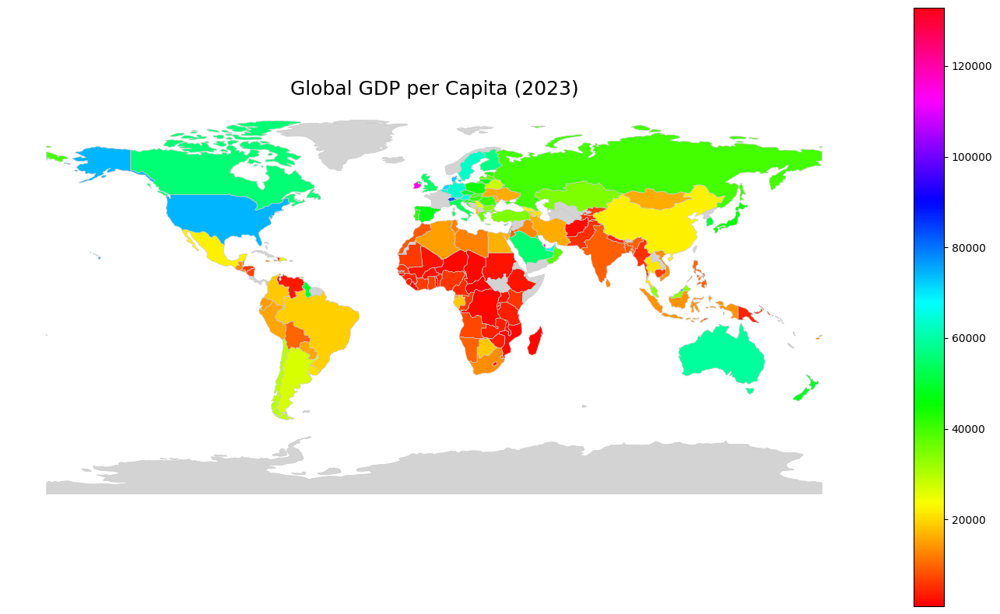

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet1")

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})
gdp_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2023)]

years = sorted(gdp_data["Year"].unique())


for year in years:
    year_data = gdp_data[gdp_data["Year"] == year]
    merged = world.merge(year_data, how="left", left_on="ISO_A3", right_on="iso_a3")

    fig, ax = plt.subplots(figsize=(14, 8))
    merged.plot(column="gdp_per_capita",
                cmap="hsv",
                linewidth=0.5,
                ax=ax,
                edgecolor='0.8',
                legend=True,
                missing_kwds={
                    "color": "lightgrey",
                    "label": "No data"
                })

    ax.set_title(f"Global GDP per Capita ({year})", fontsize=18)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

--2025-04-16 09:48:17--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.218.220.203, 52.92.237.33, 52.92.194.209, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.218.220.203|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.3’

ne_110m_admin_0_cou 100%[===================>] 209.94K   935KB/s    in 0.2s    

2025-04-16 09:48:17 (935 KB/s) - ‘ne_110m_admin_0_countries.zip.3’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.c

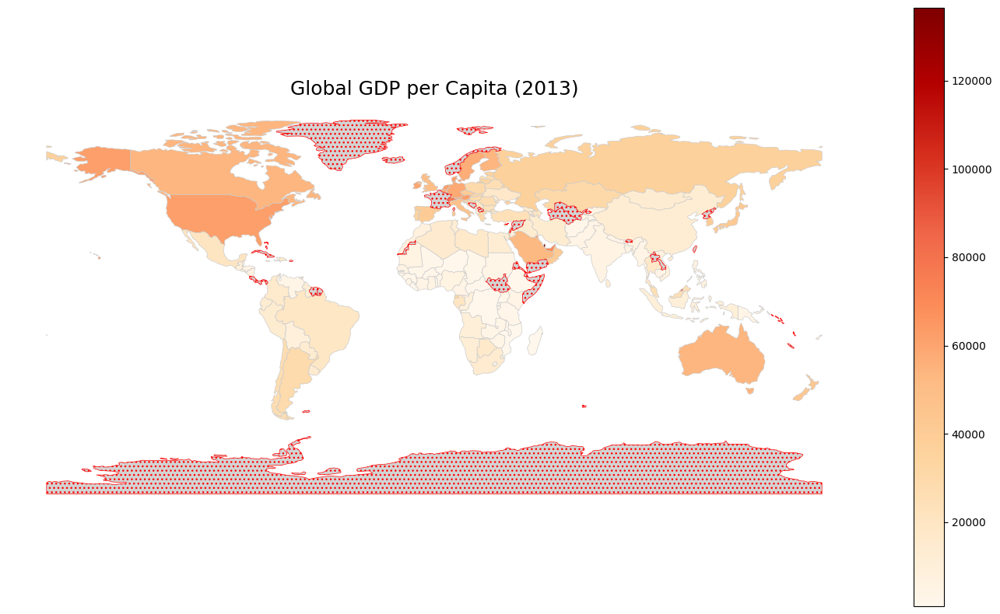

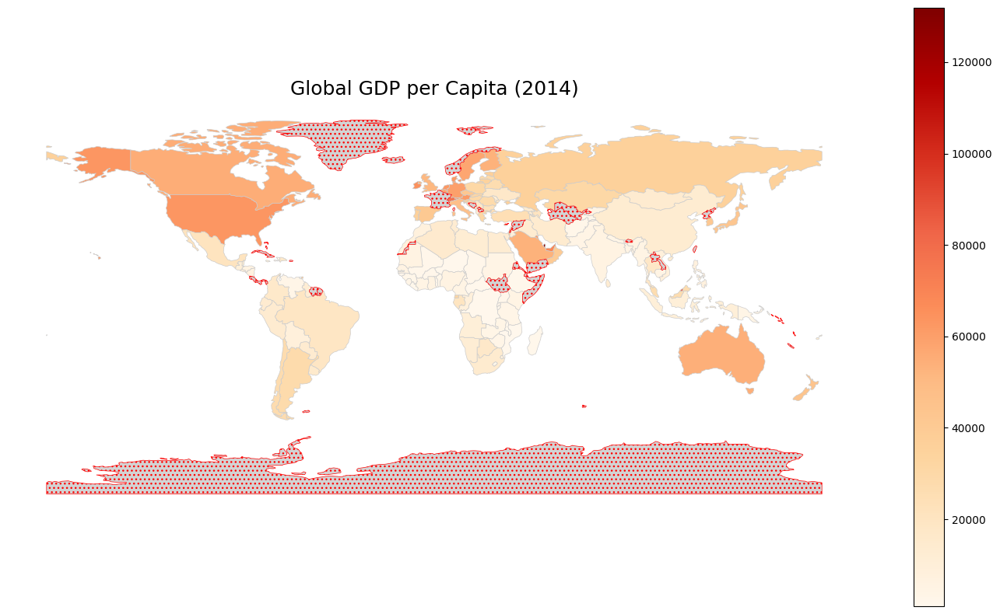

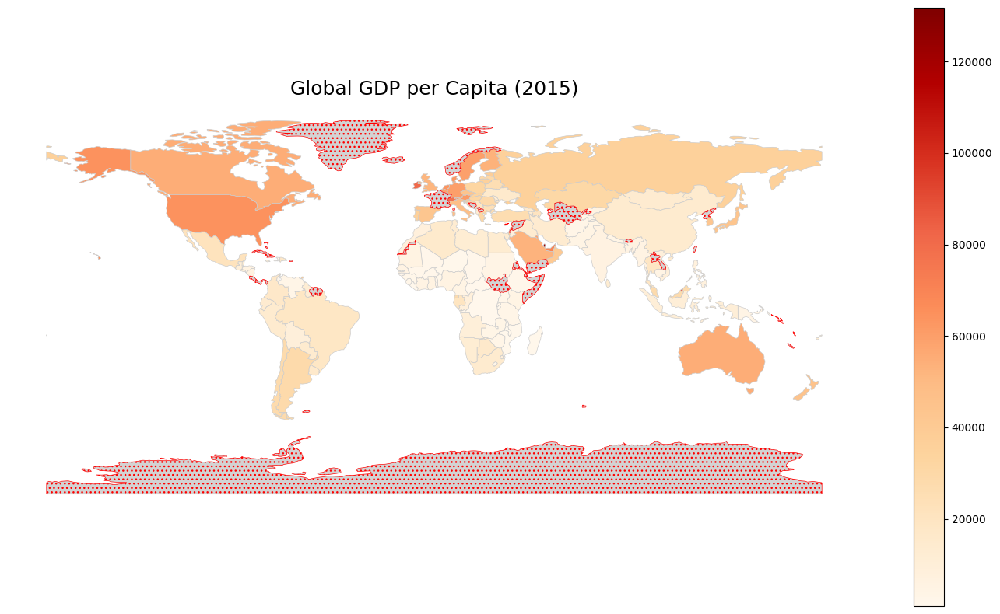

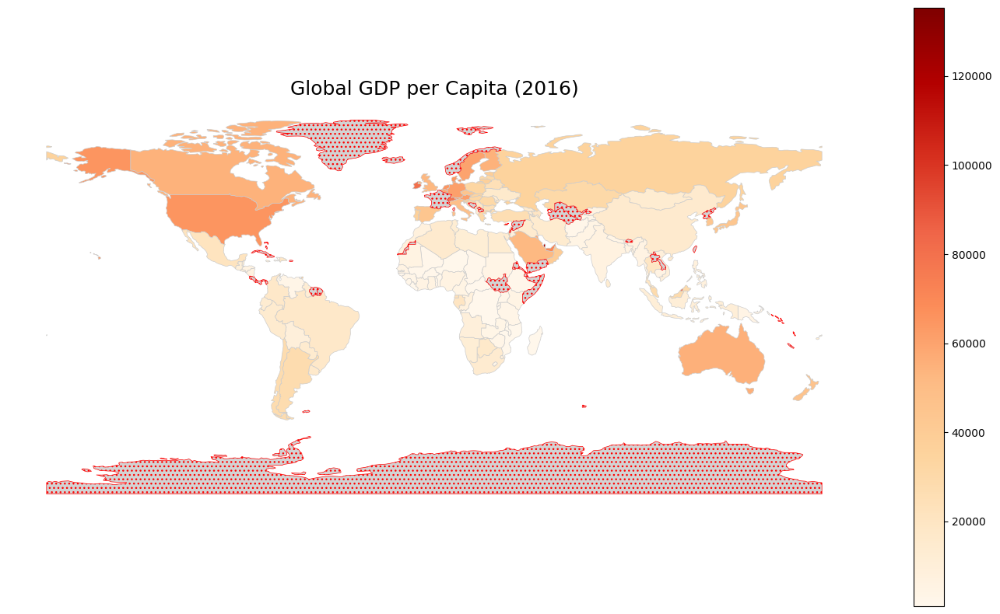

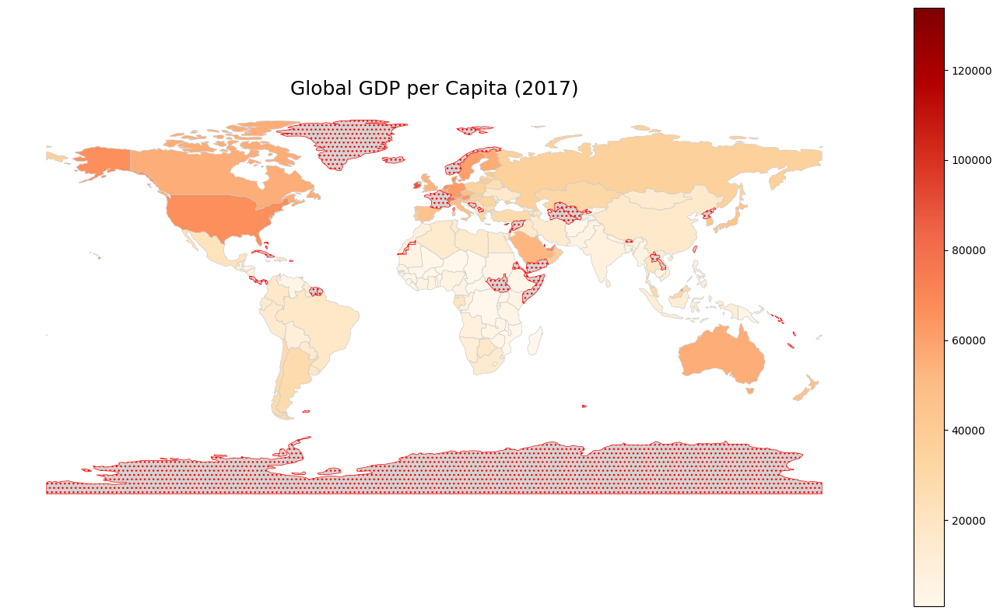

...

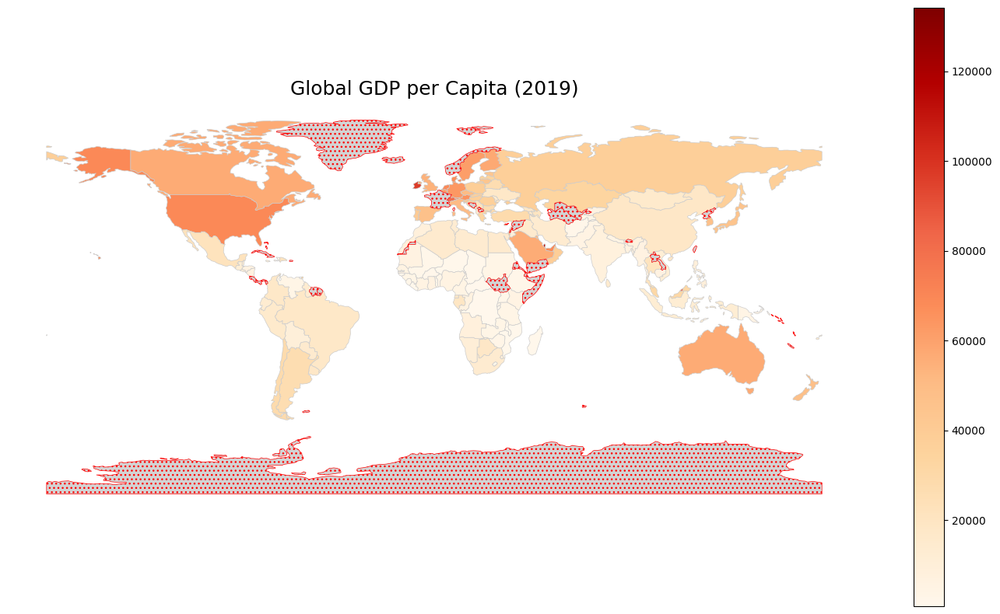

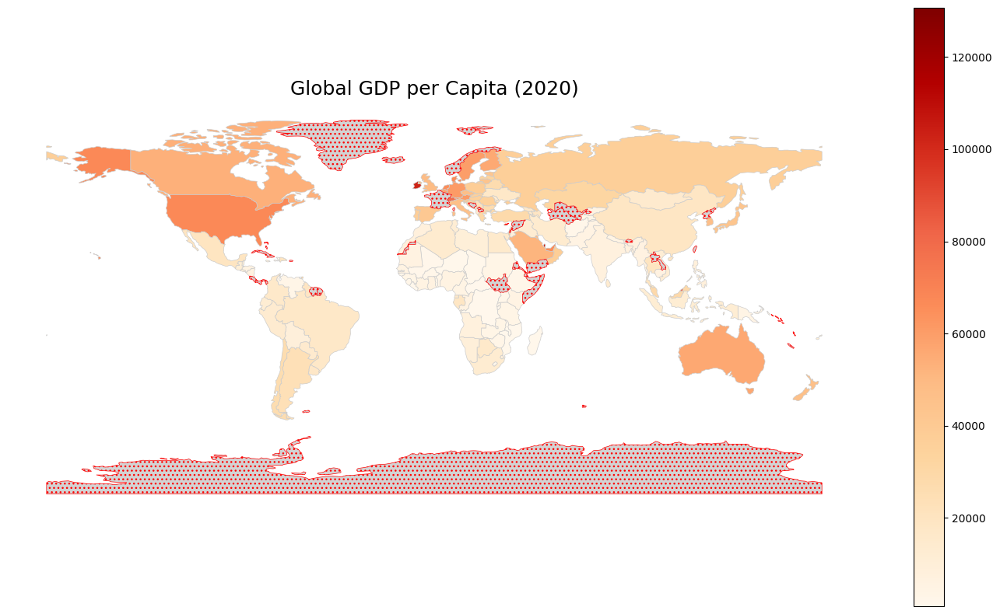

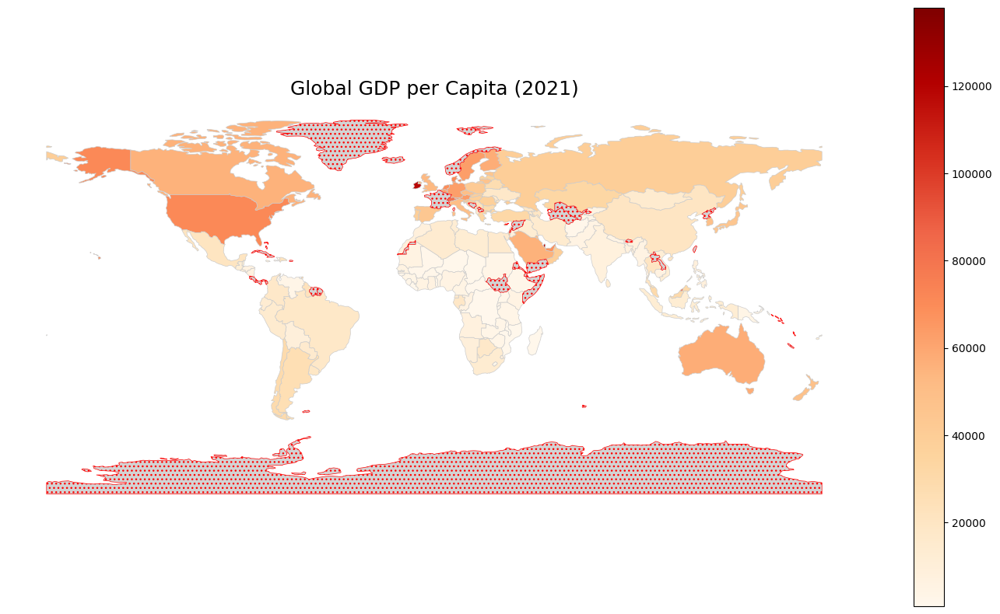

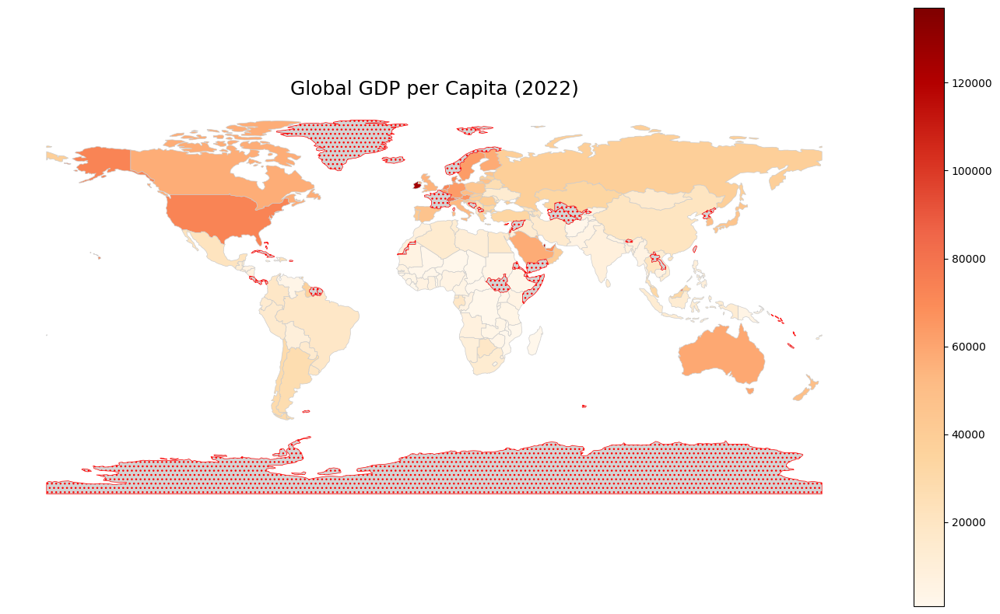

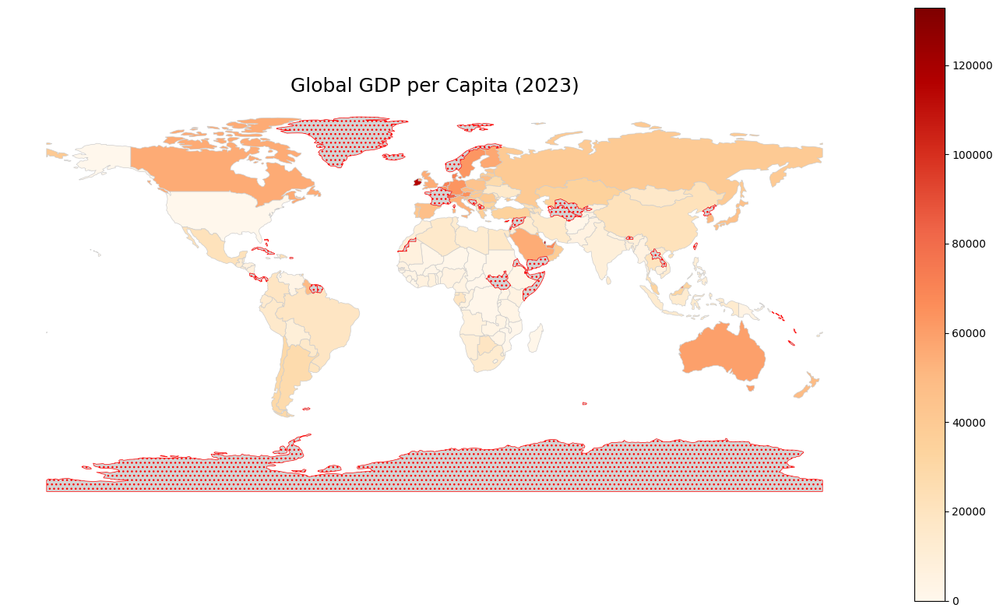

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet1")

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})
gdp_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2023)]

years = sorted(gdp_data["Year"].unique())

for year in years:
    year_data = gdp_data[gdp_data["Year"] == year]
    # Changed 'left_on' to 'ISO_A3' to match the column name in the shapefile
    merged = world.merge(year_data, how="left", left_on="ISO_A3", right_on="iso_a3")

    fig, ax = plt.subplots(figsize=(14, 8))
    merged.plot(column="gdp_per_capita",
                cmap="OrRd",
                linewidth=0.5,
                ax=ax,
                edgecolor='0.8',
                legend=True,
                missing_kwds={
                    "color": "lightgrey",
                    "edgecolor": "red",
                    "hatch": "...",
                    "label": "No data"
                })

    ax.set_title(f"Global GDP per Capita ({year})", fontsize=18)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd
import geopandas as gpd
import plotly.express as px

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet1")

df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})
gdp_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2024)]

fig = px.choropleth(
    gdp_data,
    locations="iso_a3",
    color="gdp_per_capita",
    hover_name="Country",
    animation_frame="Year",
    color_continuous_scale="Earth",
    title="Global GDP per Capita (2013–2023)",
    labels={"gdp_per_capita": "GDP per Capita"},
    range_color=(gdp_data["gdp_per_capita"].min(), gdp_data["gdp_per_capita"].max())
)

fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.write_html("global_gdp_per_capita_2013_2023.html")
fig.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import plotly.express as px

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet1")

df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})
gdp_data = df[(df["Year"] >= 2013) & (df["Year"] <= 2023)]

fig = px.choropleth(
    gdp_data,
    locations="iso_a3",
    color="gdp_per_capita",
    hover_name="Country",
    animation_frame="Year",
    color_continuous_scale="hsv",
    title="Global GDP per Capita (2013–2023)",
    labels={"gdp_per_capita": "GDP per Capita"},
    range_color=(gdp_data["gdp_per_capita"].min(), gdp_data["gdp_per_capita"].max())
)

fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import leafmap.foliumap as leafmap

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet4")
df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})

year = 2023
gdp_data = df[df["Year"] == year]

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

print(world.columns)

merged = gdp_data.merge(world[['ISO_A3', 'geometry']], left_on="iso_a3", right_on="ISO_A3", how="left")
merged = gpd.GeoDataFrame(merged, geometry='geometry', crs=world.crs) # Set geometry & CRS

geojson_path = "gdp_2023.geojson"
merged.to_file(geojson_path, driver="GeoJSON")

m = leafmap.Map(center=[20, 0], zoom=2)
m.add_basemap("Esri.WorldImagery")  # Other options: "OpenStreetMap", "Esri.WorldImagery","CartoDB.Positron" etc.

m.add_data(
    geojson_path,
    layer_name=f"GDP per Capita {year}",
    info_mode="on_hover",
    style={"fillOpacity": 0.7},
    color_column="gdp_per_capita",
    color_scheme="YlGnBu",
    column='gdp_per_capita'
)

m

--2025-04-20 19:54:07--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.92.241.153, 52.218.252.195, 52.92.241.241, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.92.241.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.2’

ne_110m_admin_0_cou 100%[===================>] 209.94K   977KB/s    in 0.2s    

2025-04-20 19:54:08 (977 KB/s) - ‘ne_110m_admin_0_countries.zip.2’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.c

In [ ]:
import pandas as pd
import geopandas as gpd
import leafmap.foliumap as leafmap

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet4")
df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})

year = 2023
gdp_data = df[df["Year"] == year]

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

print(world.columns)

merged = gdp_data.merge(world[['ISO_A3', 'geometry']], left_on="iso_a3", right_on="ISO_A3", how="left")
merged = gpd.GeoDataFrame(merged, geometry='geometry', crs=world.crs) # Set geometry & CRS

geojson_path = "gdp_2023.geojson"
merged.to_file(geojson_path, driver="GeoJSON")

m = leafmap.Map(center=[20, 0], zoom=2)
m.add_basemap("CartoDB.Positron")  # Other options: "OpenStreetMap", "Esri.WorldImagery","CartoDB.Positron" etc.

m.add_data(
    geojson_path,
    layer_name=f"GDP per Capita {year}",
    info_mode="on_hover",
    style={"fillOpacity": 0.7},
    color_column="gdp_per_capita",
    color_scheme="YlGnBu",
    column='gdp_per_capita'
)

m

--2025-04-16 09:47:37--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.218.154.43, 52.92.200.113, 52.92.177.177, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.218.154.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.2’

ne_110m_admin_0_cou 100%[===================>] 209.94K   710KB/s    in 0.3s    

2025-04-16 09:47:38 (710 KB/s) - ‘ne_110m_admin_0_countries.zip.2’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.cp

In [ ]:
import pandas as pd
import geopandas as gpd
import leafmap.foliumap as leafmap

df = pd.read_excel("blueprint5.xlsx", sheet_name="Sheet4")
df = df.rename(columns={"Code": "iso_a3", "GDP_per_capita": "gdp_per_capita"})

year = 2023
gdp_data = df[df["Year"] == year]

!wget https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
!unzip ne_110m_admin_0_countries.zip

world = gpd.read_file("ne_110m_admin_0_countries.shp")

print(world.columns)

merged = gdp_data.merge(world[['ISO_A3', 'geometry']], left_on="iso_a3", right_on="ISO_A3", how="left")
merged = gpd.GeoDataFrame(merged, geometry='geometry', crs=world.crs) # Set geometry & CRS

geojson_path = "gdp_2023.geojson"
merged.to_file(geojson_path, driver="GeoJSON")

m = leafmap.Map(center=[20, 0], zoom=2)
m.add_basemap("SATELLITE")  # Other options: "OpenStreetMap", "Esri.WorldImagery","CartoDB.Positron" etc.

m.add_data(
    geojson_path,
    layer_name=f"GDP per Capita {year}",
    info_mode="on_hover",
    style={"fillOpacity": 0.7},
    color_column="gdp_per_capita",
    color_scheme="YlGnBu",
    column='gdp_per_capita'
)

m

--2025-04-16 09:55:04--  https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip
Resolving naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)... 52.92.178.41, 52.92.153.145, 52.92.237.25, ...
Connecting to naturalearth.s3.amazonaws.com (naturalearth.s3.amazonaws.com)|52.92.178.41|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214976 (210K) [application/zip]
Saving to: ‘ne_110m_admin_0_countries.zip.7’

ne_110m_admin_0_cou 100%[===================>] 209.94K   711KB/s    in 0.3s    

2025-04-16 09:55:05 (711 KB/s) - ‘ne_110m_admin_0_countries.zip.7’ saved [214976/214976]

Archive:  ne_110m_admin_0_countries.zip
replace ne_110m_admin_0_countries.README.html? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ne_110m_admin_0_countries.README.html  
replace ne_110m_admin_0_countries.VERSION.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: ne_110m_admin_0_countries.VERSION.txt  
replace ne_110m_admin_0_countries.cpg? 